# Load Libraries

In [8]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Data Loading

In [9]:
df = pd.read_csv('retail_store_inventory.csv')
display(df.head())
display(df.tail())

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,S001,P0005,Toys,East,231,127,55,135.47,33.50,15,Sunny,1,29.69,Spring
1,2022-01-01,S001,P0001,Electronics,South,204,150,66,144.04,63.01,0,Cloudy,0,66.16,Spring
2,2022-01-01,S001,P0003,Electronics,South,102,65,51,74.02,27.99,0,Snowy,0,31.32,Spring
3,2022-01-01,S003,P0002,Electronics,North,469,61,164,62.18,32.72,0,Snowy,0,34.74,Spring
4,2022-01-01,S001,P0002,Electronics,East,166,14,135,9.26,73.64,5,Sunny,0,68.95,Summer


,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
73095,2024-01-01,S004,P0001,Electronics,East,96,8,127,18.46,73.73,0,Sunny,0,72.45,Autumn
73096,2024-01-01,S001,P0001,Electronics,North,313,51,101,48.43,82.57,0,Snowy,0,83.78,Autumn
73097,2024-01-01,S005,P0002,Electronics,East,278,36,151,39.65,11.11,5,Rainy,0,10.91,Spring
73098,2024-01-01,S002,P0001,Furniture,East,374,264,21,270.52,53.14,0,Rainy,0,55.80,Autumn
73099,2024-01-01,S001,P0001,Electronics,South,117,6,165,2.33,78.39,0,Snowy,1,79.52,Spring


# Data Exploration

In [10]:
# Explore Unique Categories
print("Unique Categories:", df['Category'].unique())

Unique Categories: ['Toys' 'Electronics' 'Furniture' 'Groceries' 'Clothing']


In [11]:
print("Dataset Shape:", df.shape)

Dataset Shape: (73100, 15)


In [12]:
print("Missing Values (%):\n", df.isnull().sum() * 100 / df.shape[0])

Missing Values (%):
 Date                  0.0
Store ID              0.0
Product ID            0.0
Category              0.0
Region                0.0
Inventory Level       0.0
Units Sold            0.0
Units Ordered         0.0
Demand Forecast       0.0
Price                 0.0
Discount              0.0
Weather Condition     0.0
Holiday/Promotion     0.0
Competitor Pricing    0.0
Seasonality           0.0
dtype: float64


In [13]:
print("Duplicate Rows:", df.duplicated().sum())

Duplicate Rows: 0


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73100 entries, 0 to 73099
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                73100 non-null  object 
 1   Store ID            73100 non-null  object 
 2   Product ID          73100 non-null  object 
 3   Category            73100 non-null  object 
 4   Region              73100 non-null  object 
 5   Inventory Level     73100 non-null  int64  
 6   Units Sold          73100 non-null  int64  
 7   Units Ordered       73100 non-null  int64  
 8   Demand Forecast     73100 non-null  float64
 9   Price               73100 non-null  float64
 10  Discount            73100 non-null  int64  
 11  Weather Condition   73100 non-null  object 
 12  Holiday/Promotion   73100 non-null  int64  
 13  Competitor Pricing  73100 non-null  float64
 14  Seasonality         73100 non-null  object 
dtypes: float64(3), int64(5), object(7)
memory usage: 8.4+

In [15]:
display(df.describe())

,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Holiday/Promotion,Competitor Pricing
count,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000
mean,274.469877,136.464870,110.004473,141.494720,55.135108,4.966553,0.200000,55.146077
std,129.949514,108.919406,52.277448,109.254076,26.021945,6.108381,0.400003,26.191408
min,50.000000,0.000000,20.000000,-9.990000,10.000000,0.000000,0.000000,5.030000
25%,162.000000,49.000000,65.000000,53.670000,32.650000,0.000000,0.000000,32.680000
50%,273.000000,107.000000,110.000000,113.015000,55.050000,0.000000,0.000000,55.010000
75%,387.000000,203.000000,155.000000,208.052500,77.860000,10.000000,0.000000,77.820000
max,500.000000,499.000000,200.000000,518.550000,100.000000,20.000000,1.000000,104.940000


In [16]:
display(df.describe(include='object'))

,Date,Store ID,Product ID,Category,Region,Weather Condition,Seasonality
count,73100,73100,73100,73100,73100,73100,73100
unique,731,5,5,5,4,4,4
top,2022-01-01,S001,P0001,Electronics,East,Sunny,Spring
freq,100,51238,29155,43830,36582,43739,47370


In [17]:
rename_dict = {
    'S001': 'Store A',
    'S002': 'Store B',
    'S003': 'Store C',
    'S004': 'Store D',
    'S005': 'Store E'
}
df['Store ID'] = df['Store ID'].replace(rename_dict)
print("New Store Names:", df['Store ID'].unique())

New Store Names: ['Store A' 'Store C' 'Store E' 'Store B' 'Store D']


In [18]:
# Get unique Product IDs and their corresponding Category
product_category_group = df.groupby('Product ID')['Category'].unique().reset_index()

# Display the result
product_category_group

,Product ID,Category
0,P0001,"[Electronics, Furniture, Groceries, Clothing, ..."
1,P0002,"[Electronics, Toys, Furniture, Groceries, Clot..."
2,P0003,"[Electronics, Furniture, Groceries, Clothing, ..."
3,P0004,"[Electronics, Clothing, Toys, Groceries, Furni..."
4,P0005,"[Toys, Electronics, Clothing, Furniture, Groce..."


In [19]:
# Function to rename Product ID based on Category
def rename_product(row):
    # Extract numeric part of Product ID
    product_number = int(row['Product ID'][1:])  # Remove the 'P' and convert to int
    
    # Define a mapping for categories to their respective initials
    category_initials = {
        'Groceries': 'G',
        'Toys': 'T',
        'Electronics': 'E',
        'Clothing': 'C',
        'Furniture': 'F'
    }
    
    # Get the category initial
    category_initial = category_initials.get(row['Category'], '')
    
    # Construct the new Product ID (e.g., P1G, P2T, etc.)
    renamed_id = f"P{product_number}{category_initial.upper()}"
    
    return renamed_id

# Apply the renaming function to the DataFrame
df['Product ID'] = df.apply(rename_product, axis=1)

# Display the DataFrame with renamed Product IDs
df.head()

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,Store A,P5T,Toys,East,231,127,55,135.47,33.50,15,Sunny,1,29.69,Spring
1,2022-01-01,Store A,P1E,Electronics,South,204,150,66,144.04,63.01,0,Cloudy,0,66.16,Spring
2,2022-01-01,Store A,P3E,Electronics,South,102,65,51,74.02,27.99,0,Snowy,0,31.32,Spring
3,2022-01-01,Store C,P2E,Electronics,North,469,61,164,62.18,32.72,0,Snowy,0,34.74,Spring
4,2022-01-01,Store A,P2E,Electronics,East,166,14,135,9.26,73.64,5,Sunny,0,68.95,Summer


In [20]:
pd.set_option('display.max_colwidth', None)

# Get unique Product IDs and their corresponding Category
product_category_group = df.groupby('Category')['Product ID'].unique().reset_index()

# Display the result
product_category_group

,Category,Product ID
0,Clothing,"[P4C, P1C, P2C, P3C, P5C]"
1,Electronics,"[P1E, P3E, P2E, P4E, P5E]"
2,Furniture,"[P1F, P2F, P3F, P5F, P4F]"
3,Groceries,"[P1G, P2G, P3G, P4G, P5G]"
4,Toys,"[P5T, P2T, P4T, P1T, P3T]"


# Exploratory Data Analysis (EDA)

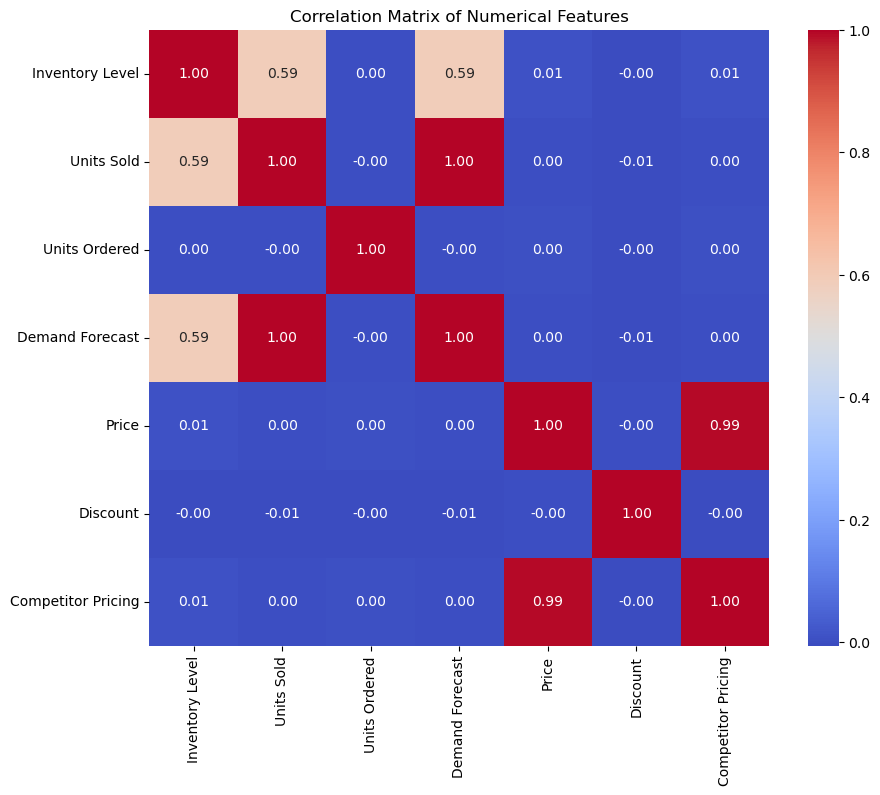

In [21]:
# Correlation Matrix and Heatmap
numerical_features = ['Inventory Level', 'Units Sold', 'Units Ordered', 'Demand Forecast', 'Price', 'Discount', 'Competitor Pricing']
correlation_matrix = df[numerical_features].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Numerical Features")
plt.show()

In [22]:
fig = px.pie(df, names='Category', hole=0.5, 
             title='Distribution of Category', template='plotly_dark')
fig.show()

In [23]:
df_counts = df['Weather Condition'].value_counts().reset_index()

fig = px.bar(df_counts, x='Weather Condition', y='count',
             title='Distribution of Weather Condition',
             text_auto=True,
             color_discrete_sequence=['DeepSkyBlue'], template='plotly_dark')
fig.update_layout(xaxis_title='Weather Condition', yaxis_title='Frequency')
fig.show()

In [24]:
fig = px.pie(df, names='Region', 
             title='Distribution of Region', template='plotly_dark')
fig.show()

In [25]:
df_counts = df['Discount'].value_counts().reset_index()

fig = px.bar(df_counts, x='Discount', y='count',
             title='Distribution of Discount',
             text_auto=True,
             color_discrete_sequence=['greenyellow'], template='plotly_dark')
fig.update_layout(xaxis_title='Discount', yaxis_title='Frequency')
fig.show()

In [26]:
fig = px.pie(df, names='Holiday/Promotion', 
             title='Distribution of Holiday/Promotion', template='plotly_dark')
fig.show()

In [27]:
df_counts = df['Seasonality'].value_counts().reset_index()

fig = px.bar(df_counts, x='Seasonality', y='count',
             title='Distribution of Seasonality',
             text_auto=True,
             color_discrete_sequence=['brown'], template='plotly_dark')
fig.update_layout(xaxis_title='Seasonality', yaxis_title='Frequency')
fig.show()

In [28]:
fig = px.histogram(df, x='Inventory Level', nbins=30, 
                   title='Distribution of Inventory Levels',
                   color_discrete_sequence=['navy'], template='plotly_dark')
fig.update_layout(xaxis_title='Inventory Level', yaxis_title='Frequency')
fig.show()

In [29]:
fig = px.histogram(df, x='Units Ordered', nbins=30, 
                   title='Distribution of Units Ordered',
                   color_discrete_sequence=['purple'], template='plotly_dark')
fig.update_layout(xaxis_title='Units Ordered', yaxis_title='Frequency')
fig.show()

In [30]:
fig = px.histogram(df, x='Units Sold', nbins=30, 
                   title='Distribution of Units Sold',
                   color_discrete_sequence=['red'], template='plotly_dark')
fig.update_layout(xaxis_title='Units Sold', yaxis_title='Frequency')
fig.show()

In [31]:
fig = px.histogram(df, x='Demand Forecast', nbins=30, 
                   title='Distribution of Demand Forecast',
                   color_discrete_sequence=['orange'], template='plotly_dark')
fig.update_layout(xaxis_title='Demand Forecast', yaxis_title='Frequency')
fig.show()

In [32]:
fig = px.histogram(df, x='Price', nbins=30, 
                   title='Distribution oaf Price',
                   color_discrete_sequence=['magenta'], template='plotly_dark')
fig.update_layout(xaxis_title='Price', yaxis_title='Frequency')
fig.show()

In [33]:
fig = px.histogram(df, x='Competitor Pricing', nbins=30, 
                   title='Distribution of Competitor Pricing',
                   color_discrete_sequence=['olive'], template='plotly_dark')
fig.update_layout(xaxis_title='Price', yaxis_title='Frequency')
fig.show()

In [34]:
df_grouped = df.groupby('Category', as_index=False)['Price'].sum()

fig = px.bar(df_grouped, x='Category', y='Price', 
             title='Total Price by Category', 
             color='Category', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Category', yaxis_title='Price')

fig.show()

In [35]:
df_grouped = df.groupby('Weather Condition', as_index=False)['Price'].sum()

fig = px.bar(df_grouped, x='Weather Condition', y='Price', 
             title='Total Price by Weather Condition', 
             color='Weather Condition', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Weather Condition', yaxis_title='Price')

fig.show()

In [36]:
df_grouped = df.groupby('Seasonality', as_index=False)['Price'].sum()

fig = px.bar(df_grouped, x='Seasonality', y='Price', 
             title='Total Price by Seasonality', 
             color='Seasonality', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Seasonality', yaxis_title='Price')

fig.show()

In [37]:
df_grouped = df.groupby('Region', as_index=False)['Price'].sum()

fig = px.bar(df_grouped, x='Region', y='Price', 
             title='Total Price by Region', 
             color='Region', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Region', yaxis_title='Price')

fig.show()

In [38]:
df_grouped = df.groupby('Discount', as_index=False)['Price'].sum()

fig = px.bar(df_grouped, x='Discount', y='Price', 
             title='Total Price by Discount', 
             color='Discount', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Discount', yaxis_title='Price')

fig.show()

In [39]:
df_grouped = df.groupby('Holiday/Promotion', as_index=False)['Price'].sum()

fig = px.bar(df_grouped, x='Holiday/Promotion', y='Price', 
             title='Total Price by Holiday/Promotion', 
             color='Holiday/Promotion', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Holiday/Promotion', yaxis_title='Price')

fig.show()

In [40]:
# Get the top 6 highest priced products without duplicate Product IDs
top_6_highest = df.sort_values(by='Price', ascending=False).drop_duplicates(subset='Product ID').head(6)

# Get the top 6 lowest priced products without duplicate Product IDs
top_6_lowest = df.sort_values(by='Price', ascending=True).drop_duplicates(subset='Product ID').head(6)

# Create the Plotly figure
fig = go.Figure()

# Add bars for the highest priced products
fig.add_trace(go.Bar(
    x=top_6_highest['Product ID'],
    y=top_6_highest['Price'],
    name='Top 6 Highest Priced',
    marker=dict(color='royalblue'),
    text=top_6_highest['Price'],  # Display price values on hover
    textposition='outside',
))

# Add bars for the lowest priced products
fig.add_trace(go.Bar(
    x=top_6_lowest['Product ID'],
    y=top_6_lowest['Price'],
    name='Top 6 Lowest Priced',
    marker=dict(color='tomato'),
    text=top_6_lowest['Price'],  # Display price values on hover
    textposition='outside',
))

# Update the layout for better readability
fig.update_layout(
    title='Top 6 Highest and Lowest Priced Products',
    xaxis_title='Product ID',
    yaxis_title='Price',
    barmode='group',  # Group the bars for comparison
    template='plotly_dark',  # Optional: Change the template
    height=500,
    showlegend=True  # Show legend for categories
)

# Show the plot
fig.show()

In [41]:
# Group by Store ID and calculate the total price for each store
top_stores = df.groupby('Store ID').agg({'Price': 'sum'}).reset_index()

# Sort the stores by total price in descending order and get the top 3
top_3_stores = top_stores.sort_values(by='Price', ascending=False).head(3)

# Create the Plotly figure
fig = go.Figure()

# Add bars for the top 3 stores by total price
fig.add_trace(go.Bar(
    x=top_3_stores['Store ID'],
    y=top_3_stores['Price'],
    name='Top 3 Stores by Total Price',
    marker=dict(color='green'),
    text=top_3_stores['Price'],  # Display total price on hover
    textposition='outside',
))

# Update the layout for better readability
fig.update_layout(
    title='Top 3 Stores by Total Price',
    xaxis_title='Store ID',
    yaxis_title='Total Price',
    template='plotly_dark',  # Optional: Change the template
    height=500,
    showlegend=False  # No legend needed in this case
)

# Show the plot
fig.show()

In [42]:
df_grouped = df.groupby('Date', as_index=False)['Price'].sum()

fig = px.line(df_grouped, x='Date', y='Price', 
              title='Total Price Over Time', 
              markers=True, template='plotly_dark')  # Adds data points

fig.update_layout(xaxis_title='Date', yaxis_title='Price')
fig.show()

# Data Preprossing

In [43]:
#change the string values in numeric because ML model not be traind on string values
le=LabelEncoder()
df['Category']=le.fit_transform(df['Category'])
df['Region']=le.fit_transform(df['Region'])
df['Weather Condition']=le.fit_transform(df['Weather Condition'])
df['Seasonality']=le.fit_transform(df['Seasonality'])

In [44]:
df.drop(columns=['Store ID','Product ID','Date'],axis=1,inplace=True)

# Modeling

In [45]:
X=df.drop('Demand Forecast',axis=1)
y=df['Demand Forecast']

In [46]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [47]:
scaler=StandardScaler()

X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.fit_transform(X_test)

In [48]:
# Define list of models
models = [
    LinearRegression(),
    RandomForestRegressor(random_state=42, n_jobs=-1),
    XGBRegressor(random_state=42, verbosity=0),
    LGBMRegressor(random_state=42)
]

# Model Evaluation

In [49]:
# Define and fit models individually
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

random_forest_model = RandomForestRegressor(random_state=42, n_jobs=-1)
random_forest_model.fit(X_train, y_train)

xgb_model = XGBRegressor(random_state=42, verbosity=0)
xgb_model.fit(X_train, y_train)

lgb_model = LGBMRegressor(random_state=42)
lgb_model.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1222
[LightGBM] [Info] Number of data points in the train set: 58480, number of used features: 11
[LightGBM] [Info] Start training from score 141.776563


LGBMRegressor(random_state=42)

In [50]:
# Helper function to evaluate models
def evaluate_model(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    mae = mean_absolute_error(y_test, preds)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    r2 = r2_score(y_test, preds)
    return {
        'Model': model.__class__.__name__,
        'MAE': mae,
        'RMSE': rmse,
        'R2_Score': r2
    }

In [51]:
# Define regression models
regressors = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(random_state=42, n_jobs=-1),
    "XGBoost": XGBRegressor(random_state=42, verbosity=0),
    "LightGBM": LGBMRegressor(random_state=42)
}

# Store results
results = []
predictions = {}

# Evaluate each regressor
for name, model in regressors.items():
    # Use scaled data only for models that need it
    if name in ["Linear Regression"]:
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)
    else:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

    # Store predictions
    predictions[name] = y_pred

    # Calculate metrics
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    results.append({
        "Model": name,
        "R2 Score": r2,
        "MSE": mse,
        "MAE": mae
    })

# Convert to DataFrame
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by="R2 Score", ascending=False)

print("\nFinal Results:")
print(results_df)

# Detailed evaluation for best model
best_model_name = results_df.iloc[0]['Model']
y_pred = predictions[best_model_name]

print(f"\nDetailed Evaluation for Best Model ({best_model_name}):")
print(f"R2 Score: {r2_score(y_test, y_pred):.4f}")
print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred):.4f}")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred):.4f}")


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1222
[LightGBM] [Info] Number of data points in the train set: 58480, number of used features: 11
[LightGBM] [Info] Start training from score 141.776563

Final Results:
               Model  R2 Score        MSE       MAE
3           LightGBM  0.993655  75.630135  7.490423
0  Linear Regression  0.993561  76.757000  7.542269
2            XGBoost  0.993403  78.638839  7.582784
1      Random Forest  0.993298  79.892736  7.632278

Detailed Evaluation for Best Model (LightGBM):
R2 Score: 0.9937
Mean Squared Error: 75.6301
Mean Absolute Error: 7.4904


In [52]:
y_train_pred = model.predict(X_train)

print("Train R2:", r2_score(y_train, y_train_pred))
print("Test R2 :", r2_score(y_test, y_pred))

Train R2: 0.9939469645102731
Test R2 : 0.9936553877067223


# Save the Model

In [53]:
import joblib

# Save each model
for name, model in regressors.items():
    joblib.dump(model, f'{name.lower().replace(" ", "_")}_model.pkl')

print("All models saved successfully.")

All models saved successfully.


In [54]:
%%writefile main.py
import streamlit as st
import pandas as pd
import numpy as np
import joblib

# Load the best model (LightGBM)
lightgbm_model = joblib.load('lightgbm_model.pkl')

# Page configuration
st.set_page_config(page_title="Retail Demand Forecasting | DEPI Project", page_icon="📈")

# App header
st.title("📦 Retail Demand Forecasting App")
st.markdown("#### Powered by **DEPI Final Project 2025** 🚀")
st.markdown("Enter the product and store details below to predict future demand using our top-performing **LightGBM** model.")

# Input features
st.subheader("📝 Input Features")

category = st.number_input("Category (0=Clothing, 1=Electronics, 2=Furniture, 3=Groceries, 4=Toys)", min_value=0)
region = st.number_input("Region (0=East, 1=North, 2=South, 3=West)", min_value=0)
inventory_level = st.number_input("Inventory Level", min_value=0)
units_sold = st.number_input("Units Sold", min_value=0)
units_ordered = st.number_input("Units Ordered", min_value=0)
price = st.number_input("Price", min_value=0.0)
discount = st.number_input("Discount", min_value=0.0)
weather_condition = st.number_input("Weather Condition (0=Cloudy, 1=Sunny, ...)", min_value=0)
holiday_promotion = st.number_input("Holiday Promotion (0=No, 1=Yes)", min_value=0, max_value=1)
competitor_pricing = st.number_input("Competitor Pricing", min_value=0.0)
seasonality = st.number_input("Seasonality (0=Winter, 1=Spring, ...)", min_value=0)

# Predict button
if st.button("🔍 Predict Demand"):
    features = np.array([[category, region, inventory_level,
                          units_sold, units_ordered, price, discount, weather_condition,
                          holiday_promotion, competitor_pricing, seasonality]])

    # Make prediction using the LightGBM model
    prediction = lightgbm_model.predict(features)[0]

    st.success(f"📊 Predicted Demand: **{prediction:.2f} Units**")
    st.balloons()

# Footer
st.markdown("""---  
Made with ❤️ as part of **DEPI Final Project | 2025**
""")


Overwriting main.py


In [57]:
!streamlit run main.py

^C


# MLflow

In [67]:
import mlflow
import mlflow.sklearn
import mlflow.xgboost
import mlflow.lightgbm

mlflow.set_tracking_uri("file:///C:/mlflow_logs")
mlflow.set_experiment("Retail Demand Forecasting")



2025/05/10 16:26:12 INFO mlflow.tracking.fluent: Experiment with name 'Retail Demand Forecasting' does not exist. Creating a new experiment.


<Experiment: artifact_location='file:///C:/mlflow_logs/364120404990610914', creation_time=1746883572349, experiment_id='364120404990610914', last_update_time=1746883572349, lifecycle_stage='active', name='Retail Demand Forecasting', tags={}>

In [68]:
# Evaluate each regressor with MLflow tracking
for name, model in regressors.items():
    with mlflow.start_run(run_name=name):
        # Use scaled data only for models that need it
        if name in ["Linear Regression"]:
            model.fit(X_train_scaled, y_train)
            y_pred = model.predict(X_test_scaled)
        else:
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)

        # Metrics
        r2 = r2_score(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)

        # Log metrics to MLflow
        mlflow.log_metric("R2 Score", r2)
        mlflow.log_metric("MSE", mse)
        mlflow.log_metric("MAE", mae)

        # Log model to MLflow
        if name == "XGBoost":
            mlflow.xgboost.log_model(model, artifact_path="model")
        elif name == "LightGBM":
            mlflow.lightgbm.log_model(model, artifact_path="model")
        else:
            mlflow.sklearn.log_model(model, artifact_path="model")

        print(f"{name} model logged to MLflow.")

print("✅ All models trained and logged.")


2025/05/10 16:26:21 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Linear Regression model logged to MLflow.


2025/05/10 16:26:46 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Random Forest model logged to MLflow.


C:\Users\User\anaconda3\Lib\site-packages\xgboost\sklearn.py:1028: UserWarning:

[16:26:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\c_api\c_api.cc:1427: Saving model in the UBJSON format as default.  You can use file extension: `json`, `ubj` or `deprecated` to choose between formats.

2025/05/10 16:26:54 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


XGBoost model logged to MLflow.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1222
[LightGBM] [Info] Number of data points in the train set: 58480, number of used features: 11
[LightGBM] [Info] Start training from score 141.776563


2025/05/10 16:27:01 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


LightGBM model logged to MLflow.
✅ All models trained and logged.


In [72]:
!mlflow ui

^C
